## Chicago crime data analysis and modeling

### Introduction
In this notebook, we perform big data analyses on the crime data from the city of Chicago. We take advantage of the [PySpark DataFrame API](https://spark.apache.org/docs/latest/sql-programming-guide.html) (equivalent SQL queries are presented alongside) to perform queries and extract patterns from the data, and we give advice on how to improve the safety in the city based on the insights from our analyses.

This notebook is created and run on the community edition of the Databricks platform, which is free to use and provides a convenient visualization tool.

### The Data
The [dataset](https://data.cityofchicago.org/api/views/ijzp-q8t2/rows.csv?accessType=DOWNLOAD) we are using includes historical crime data (from 2001 to present) in Chicago. It is available at the [City of Chicago Data Portal](https://data.cityofchicago.org/Public-Safety/Crimes-2001-to-Present/ijzp-q8t2), where more information about the data can be found.

### Objectives
1. Perform OLAP queries to extract key information to address the following questions:
 - What are the types of crimes and how many cases are there in each type?
 - Compare the number of crimes in each districts. Which districts see high number of cases?
 - Count the number of crimes during weekends in Chicago downtown.
 - Analyze the number of crimes in each month during the year. Is there any temporal trend?
 - Analyze the number of crimes w.r.t. hour of the day on Halloween. Give travel suggestions based on the results.
 - For each type of crime, calculate the arrest rate. Give advice on policy adjustments based on the results.

2. To better visualize the geographical distribution of crimes, we will use the `folium` package and create a heatmap and visualize the crime hotspots in the city.

3. In order to reduce the crime rate, it is critical to efficiently deploy police force across the city. Ideally, the location of police stations should be in the center of a geographical region which is also the center of a cluster of crime cases. In this way, any given police stations will be able to oversee the entire cluster efficiently. To this end, we will perform clustering using the location coordinates of crime cases, and find the center of each cluster.

4. It will be greatly valuable if we are able to predict possible crimes in the future. We will use the historical crime data and external data to perform time series analysis, and we will forecast the number of crimes in the next 12 months.

### Conclusion

A report summary of my findings in this project can be found at the end of this notebook.

In [0]:
%pip install -q folium geopandas pmdarima

Python interpreter will be restarted.
WARNING: You are using pip version 20.2.4; however, version 21.3.1 is available.
You should consider upgrading via the '/local_disk0/.ephemeral_nfs/envs/pythonEnv-767df358-ff5f-4993-9e75-ad1a32cf4829/bin/python -m pip install --upgrade pip' command.
Python interpreter will be restarted.

In [0]:
from csv import reader
from pyspark.sql import Row 
from pyspark.sql import SparkSession
from pyspark.sql.types import *
from pyspark.sql.functions import *
from pyspark.sql.window import Window
from pyspark.ml.clustering import KMeans
from pyspark.ml.evaluation import ClusteringEvaluator
from pyspark.ml.feature import VectorAssembler
import statsmodels.api as sm
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import folium
from folium import plugins
import geopandas
import pmdarima as pm

import os
os.environ["PYSPARK_PYTHON"] = "python3"

sns.set_style('whitegrid')

In [0]:
import urllib.request
#urllib.request.urlretrieve("https://data.cityofchicago.org/api/views/ijzp-q8t2/rows.csv?accessType=DOWNLOAD", "/tmp/chicago_01-present.csv")
# dbutils.fs.cp("/tmp/chicago_01-present.csv", "dbfs:/chicago_crime/data/chicago_01-present.csv")
display(dbutils.fs.ls("dbfs:/chicago_crime/data/"))


path,name,size
dbfs:/chicago_crime/data/chicago_01-present.csv,chicago_01-present.csv,1744093757


In [0]:
data_path = "dbfs:/chicago_crime/data/chicago_01-present.csv"

In [0]:
from pyspark.sql import SparkSession
spark = SparkSession \
    .builder \
    .appName("chicago-crime-analysis") \
    .getOrCreate()

df_opt1 = spark.read.format("csv").option("header", "true").load(data_path)
df_opt1.createOrReplaceTempView("chicago_crime")

df = df_opt1.withColumn('Date', to_timestamp(col('Date'), 'MM/dd/yyyy hh:mm:ss a')) \
            .withColumn('Year', col('Year').cast('int')) \
            .withColumn('Updated On', to_timestamp(col('Updated On'), 'MM/dd/yyyy hh:mm:ss a')) \
            .withColumn('Latitude', col('Latitude').cast('float')) \
            .withColumn('Longitude', col('Longitude').cast('float'))

display(df)
df.printSchema() # print out the schema of the dataset

null_values = df.select([count(when(col(c).isNull(), c)).alias(c) for c in df.columns]) # count na values in each column
display(null_values)

ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,Beat,District,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
10224738,HY411648,2015-09-05T13:30:00.000+0000,043XX S WOOD ST,0486,BATTERY,DOMESTIC BATTERY SIMPLE,RESIDENCE,false,true,0924,009,12,61,08B,1165074,1875917,2015,2018-02-10T15:50:01.000+0000,41.815117,-87.67,"(41.815117282, -87.669999562)"
10224739,HY411615,2015-09-04T11:30:00.000+0000,008XX N CENTRAL AVE,0870,THEFT,POCKET-PICKING,CTA BUS,false,false,1511,015,29,25,06,1138875,1904869,2015,2018-02-10T15:50:01.000+0000,41.89508,-87.7654,"(41.895080471, -87.765400451)"
11646166,JC213529,2018-09-01T00:01:00.000+0000,082XX S INGLESIDE AVE,0810,THEFT,OVER $500,RESIDENCE,false,true,0631,006,8,44,06,null,null,2018,2019-04-06T16:04:43.000+0000,null,null,null
10224740,HY411595,2015-09-05T12:45:00.000+0000,035XX W BARRY AVE,2023,NARCOTICS,POSS: HEROIN(BRN/TAN),SIDEWALK,true,false,1412,014,35,21,18,1152037,1920384,2015,2018-02-10T15:50:01.000+0000,41.937405,-87.71665,"(41.937405765, -87.716649687)"
10224741,HY411610,2015-09-05T13:00:00.000+0000,0000X N LARAMIE AVE,0560,ASSAULT,SIMPLE,APARTMENT,false,true,1522,015,28,25,08A,1141706,1900086,2015,2018-02-10T15:50:01.000+0000,41.881905,-87.75512,"(41.881903443, -87.755121152)"
10224742,HY411435,2015-09-05T10:55:00.000+0000,082XX S LOOMIS BLVD,0610,BURGLARY,FORCIBLE ENTRY,RESIDENCE,false,false,0614,006,21,71,05,1168430,1850165,2015,2018-02-10T15:50:01.000+0000,41.744377,-87.65843,"(41.744378879, -87.658430635)"
10224743,HY411629,2015-09-04T18:00:00.000+0000,021XX W CHURCHILL ST,0620,BURGLARY,UNLAWFUL ENTRY,RESIDENCE-GARAGE,false,false,1434,014,32,24,05,1161628,1912157,2015,2018-02-10T15:50:01.000+0000,41.914635,-87.68163,"(41.914635603, -87.681630909)"
10224744,HY411605,2015-09-05T13:00:00.000+0000,025XX W CERMAK RD,0860,THEFT,RETAIL THEFT,GROCERY FOOD STORE,true,false,1034,010,25,31,06,1159734,1889313,2015,2015-09-17T11:37:18.000+0000,41.85199,-87.68922,"(41.851988885, -87.689219118)"
10224745,HY411654,2015-09-05T11:30:00.000+0000,031XX W WASHINGTON BLVD,0320,ROBBERY,STRONGARM - NO WEAPON,STREET,false,true,1222,012,27,27,03,1155536,1900515,2015,2018-02-10T15:50:01.000+0000,41.882812,-87.70432,"(41.88281374, -87.704325717)"
11645836,JC212333,2016-05-01T00:25:00.000+0000,055XX S ROCKWELL ST,1153,DECEPTIVE PRACTICE,FINANCIAL IDENTITY THEFT OVER $ 300,null,false,false,0824,008,15,63,11,null,null,2016,2019-04-06T16:04:43.000+0000,null,null,null


root
-- ID: string (nullable = true)
-- Case Number: string (nullable = true)
-- Date: timestamp (nullable = true)
-- Block: string (nullable = true)
-- IUCR: string (nullable = true)
-- Primary Type: string (nullable = true)
-- Description: string (nullable = true)
-- Location Description: string (nullable = true)
-- Arrest: string (nullable = true)
-- Domestic: string (nullable = true)
-- Beat: string (nullable = true)
-- District: string (nullable = true)
-- Ward: string (nullable = true)
-- Community Area: string (nullable = true)
-- FBI Code: string (nullable = true)
-- X Coordinate: string (nullable = true)
-- Y Coordinate: string (nullable = true)
-- Year: integer (nullable = true)
-- Updated On: timestamp (nullable = true)
-- Latitude: float (nullable = true)
-- Longitude: float (nullable = true)
-- Location: string (nullable = true)

ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,Beat,District,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,4,0,0,0,0,0,8489,0,0,0,47,614837,613480,0,73841,73841,0,0,73841,73841,73841


In [0]:
# Total number of records - 7390584

df.count()

Out[5]: 7390584

#### OLAP - question 1:
##### What are the types of crimes and how many cases are there in each type?

In [0]:
q1_result = df.groupBy('Primary Type').count().orderBy('count', ascending=False)
display(q1_result)

Primary Type,count
THEFT,1555019
BATTERY,1355245
CRIMINAL DAMAGE,842564
NARCOTICS,738874
ASSAULT,472782
OTHER OFFENSE,459549
BURGLARY,411648
MOTOR VEHICLE THEFT,340569
DECEPTIVE PRACTICE,316735
ROBBERY,277299


In [0]:
q1_sql = spark.sql("""
                   SELECT `Primary Type`, COUNT(*) AS count
                   FROM chicago_crime
                   GROUP BY `Primary Type`
                   ORDER BY count DESC
                   """
                  )

display(q1_sql)

Primary Type,count
THEFT,1555019
BATTERY,1355245
CRIMINAL DAMAGE,842564
NARCOTICS,738874
ASSAULT,472782
OTHER OFFENSE,459549
BURGLARY,411648
MOTOR VEHICLE THEFT,340569
DECEPTIVE PRACTICE,316735
ROBBERY,277299


### Note:

Due to high number of cases, I decided to focus on `violent_crimes = ['OFFENSE INVOLVING CHILDREN', 'CRIMINAL SEXUAL ASSAULT', 'ARSON', 'BATTERY', 'HOMICIDE', 'ROBBERY', 'KIDNAPPING', 'DOMESTIC VIOLENCE']` only for the rest of the analyses.

In [0]:
display(df.select('Primary Type').distinct())
violent_crimes = ['OFFENSE INVOLVING CHILDREN',
                 'CRIMINAL SEXUAL ASSAULT',
                 'ARSON',
                 'BATTERY',
                 'HOMICIDE',
                 'ROBBERY',
                 'KIDNAPPING',
                 'DOMESTIC VIOLENCE',
                ]

df = df.where(col('Primary Type').isin(violent_crimes))
display(df.groupBy('Primary Type').count().orderBy('count', ascending=False))
df.createOrReplaceTempView("chicago_crime") # update the sql table
df.count() # Number of cases after filtering out "non-violent" cases: 7390584 -> 1719025

Primary Type
OFFENSE INVOLVING CHILDREN
CRIMINAL SEXUAL ASSAULT
STALKING
PUBLIC PEACE VIOLATION
OBSCENITY
NON-CRIMINAL (SUBJECT SPECIFIED)
ARSON
GAMBLING
CRIMINAL TRESPASS
ASSAULT


Primary Type,count
BATTERY,1355245
ROBBERY,277299
OFFENSE INVOLVING CHILDREN,51919
ARSON,12498
HOMICIDE,11358
KIDNAPPING,7038
CRIMINAL SEXUAL ASSAULT,3667
DOMESTIC VIOLENCE,1


Out[8]: 1719025

#### OLAP - question 2:

**Compare the number of crimes in each districts. Which districts see high number of cases?**

In [0]:
df.select(count(when(col('District').isNull(), True))).show() # Only 11 records did not have "district" info. We will ignore them.

+-------------------------------------------------+
count(CASE WHEN (District IS NULL) THEN true END)|
+-------------------------------------------------+
 11|
+-------------------------------------------------+

In [0]:
q2_result = df.where(col('District').isNotNull()).groupBy('District').count().orderBy('count', ascending=False)
df.select(countDistinct('District').alias('distinct_districts')).show()

display(q2_result)

+------------------+
distinct_districts|
+------------------+
 24|
+------------------+

District,count
007,130690
011,120760
006,115387
004,109959
008,109693
003,105793
025,97681
005,92171
002,89566
010,87178


In [0]:
q2_sql = spark.sql("""
                   SELECT District, COUNT(*) AS count
                   FROM chicago_crime
                   WHERE District IS NOT NULL
                   GROUP BY District
                   ORDER BY count DESC 
                   """)

display(q2_sql)

District,count
007,130690
011,120760
006,115387
004,109959
008,109693
003,105793
025,97681
005,92171
002,89566
010,87178


#### OLAP - question 3:

**Count the number of crimes during weekends in Chicago downtown.**

Here, I arbitrarily defined Chicago downtown as a rectangle with the following boundaries:

Latitute (41.860178, 41.947185)

Longitude (-87.686893, -87.5998417)

In [0]:
# 10739 out of 1719025 (0.6%) have location info missing -> we will drop these records (labeled as False in udf)
df.select(count(when(col('Latitude').isNull() | col('Longitude').isNull(), True)).alias('missing_coord_count')).show()

+-------------------+
missing_coord_count|
+-------------------+
 10739|
+-------------------+

In [0]:
# (Very) arbitrarily defined Chicago downtown area: Latitute(41.860178, 41.947185), Longitude(-87.686893, -87.5998417)
def in_downtown(latitude, longitude):
  if not latitude or not longitude:
    return False
  elif 41.860178 < latitude < 41.947185 and -87.686893 < longitude < -87.5998417:
    return True
  else:
    return False

downtown_udf_bool = udf(lambda x, y:in_downtown(x, y), BooleanType())
q3_result = df.withColumn('in_downtown', downtown_udf_bool('Latitude', 'Longitude')) \
              .withColumn('day_of_week', date_format('Date', 'E')) \
              .withColumn('Date', date_format('Date', 'yyyy-MM-dd')) \
              .where(col('day_of_week').isin(['Sat', 'Sun'])) \
              .where(col('in_downtown')) \
              .groupBy('Date') \
              .count() \
              .orderBy('Date')
                      
display(q3_result)

Date,count
2001-01-06,24
2001-01-07,26
2001-01-13,25
2001-01-14,26
2001-01-20,28
2001-01-21,33
2001-01-27,32
2001-01-28,25
2001-02-03,20
2001-02-04,30


#### OLAP - question 4:

**Analyze the number of crimes in each month during the year. Is there any temporal trend?**

I chose the years 2016-2020 because I first came to Chicago in 2016 to pursue a PhD in Neurobiology. :-)

In [0]:
q4_result = df.withColumn('month_of_year', date_format('Date', 'MM')) \
              .where(col('Year').between(2016, 2020)) \
              .groupBy('Year', 'month_of_year') \
              .count() \
              .orderBy(col('Year').asc(), col('month_of_year').asc())

display(q4_result)

Year,month_of_year,count
2016,01,5179
2016,02,4469
2016,03,5395
2016,04,5122
2016,05,6041
2016,06,6129
2016,07,6136
2016,08,6195
2016,09,5665
2016,10,5840


In [0]:
q4_sql = spark.sql("""
                   SELECT Year, EXTRACT(MONTH FROM Date) AS month_of_year, COUNT(*) AS count
                   FROM chicago_crime
                   WHERE Year BETWEEN 2016 AND 2020
                   GROUP BY Year, month_of_year
                   ORDER BY Year, month_of_year
                   """)

display(q4_sql)

Year,month_of_year,count
2016,1,5179
2016,2,4469
2016,3,5395
2016,4,5122
2016,5,6041
2016,6,6129
2016,7,6136
2016,8,6195
2016,9,5665
2016,10,5840


From the graph above:

- There are more cases in Summer than in Winter (very cold in Chicago) -> Crime events may be correlated with temperature. -> It may be a good idea to use temperature in time series analysis

- During winter, there is a local maximum in December and January, which happens to be the holiday season -> In general, more patrol should be deployed in Summer and during the holiday season.

- In 2020, the whole year saw less crime compared with previous years with a significant drop in April (when covid lockdown happened) -> This decrease is most likely due to the work-from-home and social distancing policies.

### Extra question: correlation between crime numbers and temperature

In [0]:
temp_data_path = '/FileStore/tables/chicago_temp-1.csv'
temp_df = spark.read.format('csv').option('header', 'true').load(temp_data_path)
temp_df = temp_df.withColumn('TAVG', col('TAVG').cast('int')) \
                 .withColumnRenamed('DATE', 'Date') \
                 .where(col('NAME') == 'CHICAGO MIDWAY AIRPORT, IL US')

temp_df.printSchema()
display(temp_df)
temp_na = temp_df.select([count(when(col(c).isNull(), c)).alias(c) for c in temp_df.columns[-2:]]) # no na value in the temperature dataset
display(temp_na)

root
-- STATION: string (nullable = true)
-- NAME: string (nullable = true)
-- Date: string (nullable = true)
-- TAVG: integer (nullable = true)

STATION,NAME,Date,TAVG
USW00014819,"CHICAGO MIDWAY AIRPORT, IL US",2001-01,26
USW00014819,"CHICAGO MIDWAY AIRPORT, IL US",2001-02,28
USW00014819,"CHICAGO MIDWAY AIRPORT, IL US",2001-03,36
USW00014819,"CHICAGO MIDWAY AIRPORT, IL US",2001-04,55
USW00014819,"CHICAGO MIDWAY AIRPORT, IL US",2001-05,62
USW00014819,"CHICAGO MIDWAY AIRPORT, IL US",2001-06,70
USW00014819,"CHICAGO MIDWAY AIRPORT, IL US",2001-07,77
USW00014819,"CHICAGO MIDWAY AIRPORT, IL US",2001-08,75
USW00014819,"CHICAGO MIDWAY AIRPORT, IL US",2001-09,64
USW00014819,"CHICAGO MIDWAY AIRPORT, IL US",2001-10,54


Date,TAVG
0,0


In [0]:
# Join the monthly crime counts with the temperature data
monthly_df = df.withColumn('Date', date_format('Date', 'yyyy-MM')) \
             .where(col('Year').between(2001, 2019)) \
             .groupBy('Date') \
             .count() \
             .join(temp_df, on='Date', how='left') \
             .orderBy('Date') \

display(monthly_df)

Date,count,STATION,NAME,TAVG
2001-01,8353,USW00014819,"CHICAGO MIDWAY AIRPORT, IL US",26
2001-02,7493,USW00014819,"CHICAGO MIDWAY AIRPORT, IL US",28
2001-03,9460,USW00014819,"CHICAGO MIDWAY AIRPORT, IL US",36
2001-04,10062,USW00014819,"CHICAGO MIDWAY AIRPORT, IL US",55
2001-05,10782,USW00014819,"CHICAGO MIDWAY AIRPORT, IL US",62
2001-06,10702,USW00014819,"CHICAGO MIDWAY AIRPORT, IL US",70
2001-07,11295,USW00014819,"CHICAGO MIDWAY AIRPORT, IL US",77
2001-08,10493,USW00014819,"CHICAGO MIDWAY AIRPORT, IL US",75
2001-09,10175,USW00014819,"CHICAGO MIDWAY AIRPORT, IL US",64
2001-10,10240,USW00014819,"CHICAGO MIDWAY AIRPORT, IL US",54


In [0]:
monthly_df.corr('count', 'TAVG') # Some weak correlation exists

Out[19]: 0.40472041000192127

#### OLAP - question 5:

**Analyze the number of crimes w.r.t. hour of the day on Halloween. Give travel suggestions based on the results.**

In Hyde Park in south Chicago, Halloween typically sees a lot of visitors for trick-or-treat events. While many people enjoy the spooky festival, it is not uncommon to see the number of crime rising during Halloween night. In fact, in recent years my university would send out safety reminders and advice us to use caution if we need to travel on Halloween night/

In [0]:
q5_result = df.where(date_format('Date', 'MM-dd') == '10-31') \
              .where(col('Year').between(2016, 2020)) \
              .withColumn('hour_of_day', date_format('Date', 'H').cast('int')) \
              .groupBy('Year', 'hour_of_day') \
              .count() \
              .orderBy(col('Year').asc(), col('hour_of_day').asc())

display(q5_result)

Year,hour_of_day,count
2016,0,10
2016,1,5
2016,2,7
2016,3,5
2016,4,3
2016,5,2
2016,6,4
2016,7,8
2016,8,11
2016,9,9


In [0]:
q5_sql = spark.sql("""
                   SELECT Year, EXTRACT(HOUR FROM Date) AS hour, COUNT(*)
                   FROM chicago_crime
                   WHERE EXTRACT(MONTH FROM Date) == 10 AND EXTRACT(DAY FROM Date) == 31 AND Year BETWEEN 2016 AND 2020
                   GROUP BY Year, hour
                   ORDER BY Year, hour
                   """)

display(q5_sql)

Year,hour,count(1)
2016,0,10
2016,1,5
2016,2,7
2016,3,5
2016,4,3
2016,5,2
2016,6,4
2016,7,8
2016,8,11
2016,9,9


####OLAP - question 6:

**For each type of crime, calculate the arrest rate. Give advice on policy adjustments based on the results.**

There is only one domestic violence case over the last 20 years. Besides that, all other types of cases have an arrest rate below 50%, which is a worrisome issue. More strict policies are necessary to stop violent crime in the city. Funding to the police may be also needed so that there is enough police force that guarantees arrests.

In [0]:
q6_result = df.withColumn('arrest', col('arrest').cast('boolean')) \
              .groupBy('Primary Type') \
              .agg(count(when(col('arrest'), True)).alias('arrested'),
                   count('arrest').alias('total')) \
              .selectExpr('`Primary Type`', '1.0 * arrested / total AS arrest_rate') \
              .orderBy('arrest_rate', ascending=True)

display(q6_result)

Primary Type,arrest_rate
CRIMINAL SEXUAL ASSAULT,0.0769020998091083
ROBBERY,0.0955034096769191
KIDNAPPING,0.1089798238135834
ARSON,0.1260201632261162
OFFENSE INVOLVING CHILDREN,0.2040486141874844
BATTERY,0.2236850163623551
HOMICIDE,0.4690086282796267
DOMESTIC VIOLENCE,1.0000000000000000


### Visualizing crime hotspots in 2020 with a geographical map

Out map has two layers - one is a heatmap that shows the hotspots of crime; the other divides the city to several districts defined by the goverment and shows the number of crimes in each district when you hover on them.

In [0]:
geodata = geopandas.read_file('https://data.cityofchicago.org/api/geospatial/fthy-xz3r?method=export&format=GeoJSON')
geodata = geodata.astype({'dist_num': 'int'})

In [0]:
# Use button in the upperright corner to toggle layers.

m = folium.Map(location=[41.881832, -87.623177],
               zoom_start=10.5,
               min_zoom=9,
#                width=400,
#                height=600,
               tiles='CartoDB positron')

crime_heatmap_location = df.where(col('Year') == 2020) \
                           .select('Latitude', 'Longitude') \
                           .dropna()

choropleth_crime_data = df.withColumn('District', col('District').cast('int')) \
                          .where(col('District').isNotNull()) \
                          .where(col('Year')==2020) \
                          .groupBy('District') \
                          .count() \
                          .orderBy('count', ascending=False)

# Merge geojson data with case count, so that I can add an interactive tooltip later.
new_geo = geodata.rename({'dist_num': 'District'}, axis=1).merge(choropleth_crime_data.toPandas(), on='District', how='left')

folium.plugins.HeatMap(data=crime_heatmap_location.toPandas(),
                       radius=15,
                       name='heatmap',
                       min_opacity=0.15,
                      ).add_to(m)

choropleth = folium.Choropleth(geo_data=new_geo,
                               name="choropleth",
                               data=choropleth_crime_data.toPandas(),
                               columns=["District", "count"],
                               key_on="feature.properties.District",
                               bins=9,  # There is a bug. Cannot use >9 for bins. https://github.com/python-visualization/folium/issues/1254
                               fill_color="YlOrRd",
                               fill_opacity=0.7,
                               line_opacity=0.2,
                               legend_name="Violent crime cases",
                              ).add_to(m)

choropleth_customization = folium.features.GeoJson(data=new_geo,
                                                   tooltip=folium.features.GeoJsonTooltip(fields=['District', 'count'], aliases=['District', 'Number of cases'], labels=True),
                                                   highlight_function=lambda x:{'fillColor': '#000000', 'fillOpacity': 0.5},
                                                   style_function=lambda x: {'fillColor': '#ffffff', 'color':'#000000', 'fillOpacity': 0.1, 'weight': 0.1},
                                                  )

choropleth.geojson.add_child(choropleth_customization)
folium.LayerControl().add_to(m)

m

Out[24]:

Make this Notebook Trusted to load map: File -> Trust Notebook <iframe src="about:blank" style="position:absolute;width:100%;height:100%;left:0;top:0;border:none !important;" data-html=%3C%21DOCTYPE%20html%3E%0A%3Chead%3E%20%20%20%20%0A%20%20%20%20%3Cmeta%20http-equiv%3D%22content-type%22%20content%3D%22text/html%3B%20charset%3DUTF-8%22%20/%3E%0A%20%20%20%20%0A%20%20%20%20%20%20%20%20%3Cscript%3E%0A%20%20%20%20%20%20%20%20%20%20%20%20L_NO_TOUCH%20%3D%20false%3B%0A%20%20%20%20%20%20%20%20%20%20%20%20L_DISABLE_3D%20%3D%20false%3B%0A%20%20%20%20%20%20%20%20%3C/script%3E%0A%20%20%20%20%0A%20%20%20%20%3Cstyle%3Ehtml%2C%20body%20%7Bwidth%3A%20100%25%3Bheight%3A%20100%25%3Bmargin%3A%200%3Bpadding%3A%200%3B%7D%3C/style%3E%0A%20%20%20%20%3Cstyle%3E%23map%20%7Bposition%3Aabsolute%3Btop%3A0%3Bbottom%3A0%3Bright%3A0%3Bleft%3A0%3B%7D%3C/style%3E%0A%20%20%20%20%3Cscript%20src%3D%22https%3A//cdn.jsdelivr.net/npm/leaflet%401.6.0/dist/leaflet.js%22%3E%3C/script%3E%0A%20%20%20%20%3Cscript%20src%3D%22https%3A//code.jquery.com/jquery-1.12.4.min.js%22%3E%3C/script%3E%0A%20%20%20%20%3Cscript%20src%3D%22https%3A//maxcdn.bootstrapcdn.com/bootstrap/3.2.0/js/bootstrap.min.js%22%3E%3C/script%3E%0A%20%20%20%20%3Cscript%20src%3D%22https%3A//cdnjs.cloudflare.com/ajax/libs/Leaflet.awesome-markers/2.0.2/leaflet.awesome-markers.js%22%3E%3C/script%3E%0A%20%20%20%20%3Clink%20rel%3D%22stylesheet%22%20href%3D%22https%3A//cdn.jsdelivr.net/npm/leaflet%401.6.0/dist/leaflet.css%22/%3E%0A%20%20%20%20%3Clink%20rel%3D%22stylesheet%22%20href%3D%22https%3A//maxcdn.bootstrapcdn.com/bootstrap/3.2.0/css/bootstrap.min.css%22/%3E%0A%20%20%20%20%3Clink%20rel%3D%22stylesheet%22%20href%3D%22https%3A//maxcdn.bootstrapcdn.com/bootstrap/3.2.0/css/bootstrap-theme.min.css%22/%3E%0A%20%20%20%20%3Clink%20rel%3D%22stylesheet%22%20href%3D%22https%3A//maxcdn.bootstrapcdn.com/font-awesome/4.6.3/css/font-awesome.min.css%22/%3E%0A%20%20%20%20%3Clink%20rel%3D%22stylesheet%22%20href%3D%22https%3A//cdnjs.cloudflare.com/ajax/libs/Leaflet.awesome-markers/2.0.2/leaflet.awesome-markers.css%22/%3E%0A%20%20%20%20%3Clink%20rel%3D%22stylesheet%22%20href%3D%22https%3A//cdn.jsdelivr.net/gh/python-visualization/folium/folium/templates/leaflet.awesome.rotate.min.css%22/%3E%0A%20%20%20%20%0A%20%20%20%20%20%20%20%20%20%20%20%20%3Cmeta%20name%3D%22viewport%22%20content%3D%22width%3Ddevice-width%2C%0A%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20initial-scale%3D1.0%2C%20maximum-scale%3D1.0%2C%20user-scalable%3Dno%22%20/%3E%0A%20%20%20%20%20%20%20%20%20%20%20%20%3Cstyle%3E%0A%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%23map_396ec8edaed04df8988b80fba6d2f6b5%20%7B%0A%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20position%3A%20relative%3B%0A%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20width%3A%20100.0%25%3B%0A%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20height%3A%20100.0%25%3B%0A%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20left%3A%200.0%25%3B%0A%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20top%3A%200.0%25%3B%0A%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%7D%0A%20%20%20%20%20%20%20%20%20%20%20%20%3C/style%3E%0A%20%20%20%20%20%20%20%20%0A%20%20%20%20%3Cscript%20src%3D%22https%3A//cdn.jsdelivr.net/gh/python-visualization/folium%40master/folium/templates/leaflet_heat.min.js%22%3E%3C/script%3E%0A%20%20%20%20%0A%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%3Cstyle%3E%0A%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20.foliumtooltip%20%7B%0A%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%0A%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%7D%0A%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20.foliumtooltip%20table%7B%0A%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20margin%3A%20auto%3B%0A%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%7D%0A%20%20%20%20%20%20%20%20%

### Unsupervised learning: clustering based on spatial data

In [0]:
# Only doing for cases in 2020

location_df = df.where(col('Year') == 2020) \
                .select('Latitude', 'Longitude') \
                .dropna()

print(location_df.count()) # 53661 total cases
display(location_df)

53661

Latitude,Longitude
41.86015,-87.71281
41.707542,-87.56571
41.772728,-87.62887
41.87351,-87.701004
41.922817,-87.79705
41.919205,-87.78776
41.71349,-87.62967
41.79175,-87.64509
41.76402,-87.58054
41.770145,-87.64818


In [0]:
assembler = VectorAssembler(inputCols=['Latitude', 'Longitude'], outputCol='clustering_feature')
kmeans_df = assembler.transform(location_df)

display(kmeans_df)

Latitude,Longitude,clustering_feature
41.86015,-87.71281,"Map(vectorType -> dense, length -> 2, values -> List(41.86014938354492, -87.71280670166016))"
41.707542,-87.56571,"Map(vectorType -> dense, length -> 2, values -> List(41.707542419433594, -87.56571197509766))"
41.772728,-87.62887,"Map(vectorType -> dense, length -> 2, values -> List(41.772727966308594, -87.62886810302734))"
41.87351,-87.701004,"Map(vectorType -> dense, length -> 2, values -> List(41.87350845336914, -87.70100402832031))"
41.922817,-87.79705,"Map(vectorType -> dense, length -> 2, values -> List(41.92281723022461, -87.79705047607422))"
41.919205,-87.78776,"Map(vectorType -> dense, length -> 2, values -> List(41.91920471191406, -87.78775787353516))"
41.71349,-87.62967,"Map(vectorType -> dense, length -> 2, values -> List(41.7134895324707, -87.62966918945312))"
41.79175,-87.64509,"Map(vectorType -> dense, length -> 2, values -> List(41.791751861572266, -87.64508819580078))"
41.76402,-87.58054,"Map(vectorType -> dense, length -> 2, values -> List(41.76401901245117, -87.5805435180664))"
41.770145,-87.64818,"Map(vectorType -> dense, length -> 2, values -> List(41.770145416259766, -87.64817810058594))"


In [0]:
# This takes ~30 min to run in the community edition.

# MAX_K = 12
# silhouette_scores = {}

# for k in range(4, MAX_K+1):
#   kmeans = KMeans().setK(k) \
#                    .setSeed(42) \
#                    .setFeaturesCol('clustering_feature')
#   kmeans_model = kmeans.fit(kmeans_df)
#   kmeans_prediction = kmeans_model.transform(kmeans_df)
#   evaluator = ClusteringEvaluator(featuresCol='clustering_feature',
#                                 predictionCol='prediction',
#                                 metricName='silhouette',
#                                 distanceMeasure='squaredEuclidean',
#                                )

#   score = evaluator.evaluate(kmeans_prediction)
#   silhouette_scores[k] = score

silhouette_scores = {4: 0.4867268018503714,
                     5: 0.565277339351892,
                     6: 0.5874898361907671,
                     7: 0.5651765940288505,
                     8: 0.5685718537740557,
                     9: 0.5472676341577986,
                     10: 0.5593652005871297,
                     11: 0.5687647093110673,
                     12: 0.5604064426282169,
                    }

Out[28]:

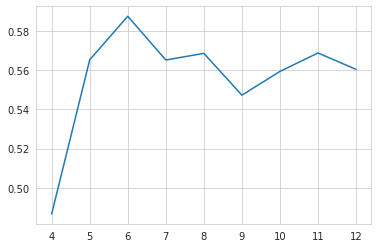

[<matplotlib.lines.Line2D at 0x7f1992a5a460>]

In [0]:
plt.plot(list(silhouette_scores.keys()), list(silhouette_scores.values()))

In [0]:
kmeans = KMeans().setK(6) \
                 .setSeed(42) \
                 .setFeaturesCol('clustering_feature')
kmeans_model = kmeans.fit(kmeans_df)
kmeans_prediction = kmeans_model.transform(kmeans_df)

In [0]:
display(kmeans_prediction.groupBy('prediction') \
                         .count() \
                         .orderBy('prediction'))

prediction,count
0,7074
1,10687
2,14879
3,9815
4,6096
5,5110


In [0]:
display(kmeans_prediction)

Latitude,Longitude,clustering_feature,prediction
41.86015,-87.71281,"Map(vectorType -> dense, length -> 2, values -> List(41.86014938354492, -87.71280670166016))",2
41.707542,-87.56571,"Map(vectorType -> dense, length -> 2, values -> List(41.707542419433594, -87.56571197509766))",1
41.772728,-87.62887,"Map(vectorType -> dense, length -> 2, values -> List(41.772727966308594, -87.62886810302734))",1
41.87351,-87.701004,"Map(vectorType -> dense, length -> 2, values -> List(41.87350845336914, -87.70100402832031))",2
41.922817,-87.79705,"Map(vectorType -> dense, length -> 2, values -> List(41.92281723022461, -87.79705047607422))",2
41.919205,-87.78776,"Map(vectorType -> dense, length -> 2, values -> List(41.91920471191406, -87.78775787353516))",2
41.71349,-87.62967,"Map(vectorType -> dense, length -> 2, values -> List(41.7134895324707, -87.62966918945312))",5
41.79175,-87.64509,"Map(vectorType -> dense, length -> 2, values -> List(41.791751861572266, -87.64508819580078))",3
41.76402,-87.58054,"Map(vectorType -> dense, length -> 2, values -> List(41.76401901245117, -87.5805435180664))",1
41.770145,-87.64818,"Map(vectorType -> dense, length -> 2, values -> List(41.770145416259766, -87.64817810058594))",3


In [0]:
evaluator = ClusteringEvaluator(featuresCol='clustering_feature',
                                predictionCol='prediction',
                                metricName='silhouette',
                                distanceMeasure='squaredEuclidean',
                               )

score = evaluator.evaluate(kmeans_prediction)
print(score)

0.5874898361907671

### Time series forecasting (with ARIMA model) - Use data from 2001/1 - 2018/12 to train and evaluate with data from 2019/1 - 2019/12

In [0]:
monthly = df.withColumn('Date', date_format('Date', 'yyyy-MM')) \
            .where(col('Year').between(2001, 2019)) \
            .groupBy('Date') \
            .count() \
            .orderBy('Date')

display(monthly)

Date,count
2001-01,8353
2001-02,7493
2001-03,9460
2001-04,10062
2001-05,10782
2001-06,10702
2001-07,11295
2001-08,10493
2001-09,10175
2001-10,10240


From the graph above, it is obvious that the original monthly data is NOT stationary and has both **trend** AND **seasonality**. I'm going to try different ways to difference (both ordinary and seasonal differencing) the data below to stationalize it.

In [0]:
# The data is still somewhat nonstationary after taking the seasonal diff ('diff_12')
# The data is finally stationary after taking both seasonal diff and first diff ('seasonal_and_ordinary_diff').


window_spec = Window.orderBy('Date')
monthly = monthly.withColumn('lag_1', lag('count', offset=1).over(window_spec)) \
                 .withColumn('diff_1', expr('count - lag_1')) \
                 .withColumn('lag_12', lag('count', offset=12).over(window_spec)) \
                 .withColumn('diff_12', expr('count - lag_12')) \
                 .withColumn('diff_12_lag_1', lag('diff_12', offset=1).over(window_spec)) \
                 .withColumn('seasonal_and_ordinary_diff', expr('diff_12 - diff_12_lag_1')) \
                 .join(monthly_df, on='Date', how='left') \
                 .select('Date', monthly['count'], 'diff_1', 'diff_12', 'seasonal_and_ordinary_diff', 'TAVG')

display(monthly)

Date,count,diff_1,diff_12,seasonal_and_ordinary_diff,TAVG
2001-01,8353,null,null,null,26
2001-02,7493,-860,null,null,28
2001-03,9460,1967,null,null,36
2001-04,10062,602,null,null,55
2001-05,10782,720,null,null,62
2001-06,10702,-80,null,null,70
2001-07,11295,593,null,null,77
2001-08,10493,-802,null,null,75
2001-09,10175,-318,null,null,64
2001-10,10240,65,null,null,54


In [0]:
# Convert to pd.DataFrame to work with the ARIMA model

monthly_pd = monthly.toPandas()

monthly_pd.shape

Out[47]: (228, 6)

Plotting the ACF and the PACF which confirm that the data is stationary after differencing.

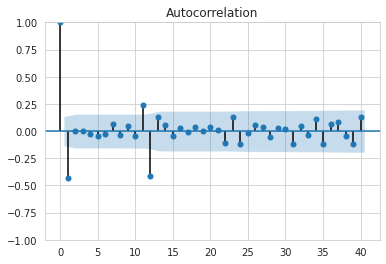

In [0]:
sm.graphics.tsa.plot_acf(monthly_pd['seasonal_and_ordinary_diff'].dropna(), lags=40, alpha=0.05)
plt.show()

/local_disk0/.ephemeral_nfs/envs/pythonEnv-767df358-ff5f-4993-9e75-ad1a32cf4829/lib/python3.8/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
 warnings.warn(

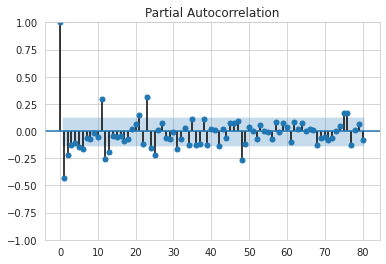

In [0]:
sm.graphics.tsa.plot_pacf(monthly_pd['seasonal_and_ordinary_diff'].dropna(), lags=80, alpha=0.05)
plt.show()

In [0]:
n_period = 12 # forecast 12 months to evaluate the model (2019.1 - 2019.12)

train = monthly_pd.iloc[:-n_period]
test = monthly_pd.iloc[-n_period:]

In [0]:
auto_model = pm.auto_arima(train['count'],
                           X=train['TAVG'].to_numpy().reshape(-1, 1),
                           start_p=0,
                           start_q=0,
                           max_p=4,
                           max_q=4, # maximum p and q
                           m=12,              # frequency of series
                           d=1,
                           seasonal=True,   # No Seasonality
                           start_P=0,
                           start_Q=0,
                           max_P=4,
                           max_Q=4,
                           D=1,
                           trace=True,
                           error_action='ignore',  
                           suppress_warnings=True, 
                           stepwise=True,
                           maxiter=100,
                          )

print(auto_model.summary()) # Using temperature - (1, 1, 1) & (0, 1, 1, 12); Not using temperature - (1, 1, 1) & (2, 1, 1, 12)

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,1,0)[12] : AIC=2911.239, Time=0.12 sec
 ARIMA(1,1,0)(1,1,0)[12] : AIC=2861.448, Time=1.14 sec
 ARIMA(0,1,1)(0,1,1)[12] : AIC=2830.404, Time=1.19 sec
 ARIMA(0,1,1)(0,1,0)[12] : AIC=2875.325, Time=0.26 sec
 ARIMA(0,1,1)(1,1,1)[12] : AIC=2832.105, Time=1.63 sec
 ARIMA(0,1,1)(0,1,2)[12] : AIC=2832.020, Time=3.84 sec
 ARIMA(0,1,1)(1,1,0)[12] : AIC=2847.238, Time=1.21 sec
 ARIMA(0,1,1)(1,1,2)[12] : AIC=inf, Time=11.39 sec
 ARIMA(0,1,0)(0,1,1)[12] : AIC=2857.775, Time=0.74 sec
 ARIMA(1,1,1)(0,1,1)[12] : AIC=2825.651, Time=2.00 sec
 ARIMA(1,1,1)(0,1,0)[12] : AIC=2869.625, Time=0.96 sec
 ARIMA(1,1,1)(1,1,1)[12] : AIC=2826.751, Time=2.64 sec
 ARIMA(1,1,1)(0,1,2)[12] : AIC=2826.545, Time=5.44 sec
 ARIMA(1,1,1)(1,1,0)[12] : AIC=2843.717, Time=1.99 sec
 ARIMA(1,1,1)(1,1,2)[12] : AIC=2828.415, Time=15.15 sec
 ARIMA(1,1,0)(0,1,1)[12] : AIC=2838.789, Time=1.39 sec
 ARIMA(2,1,1)(0,1,1)[12] : AIC=2826.697, Time=2.56 sec
 ARIMA(1,1,2)(0,1,1)[12] : AIC=2826.699, Time=3.19 sec
 ARIMA(0,1,2)(0,1,1)[12] : AIC=2828.236, Time=1.71 sec
 ARIMA(2,1,0)(0,1,1)[12] : AIC=2834.382, Time=1.41 sec
 ARIMA(2,1,2)(0,1,1)[12] : AIC=inf, Time=4.61 sec
 ARIMA(1,1,1)(0,1,1)[12] intercept : AIC=2827.634, Time=3.37 sec

Best model: ARIMA(1,1,1)(0,1,1)[12] 
Total fit time: 67.999 seconds
 SARIMAX Results 
==========================================================================================
Dep. Variable: y No. Observations: 216
Model: SARIMAX(1, 1, 1)x(0, 1, 1, 12) Log Likelihood -1407.826
Date: Thu, 28 Oct 2021 AIC 2825.651
Time: 19:46:19 BIC 2842.217
Sample: 0 HQIC 2832.353
 - 216 
Covariance Type: opg 
==============================================================================
 coef std err z P>|z| [0.025 0.975]
------------------------------------------------------------------------------
x1 44.0186 4.257 10.341 0.000 35.675 52.362
ar.L1 0.3847 0.107 3.599 0.000 0.175 0.594
ma.L1 -0.8019 0.072 -11.188 0.000 -0.942 -0.661
ma.S.L12 -0.5600 0.069 -8.063 0.000 -0.696 -0.424
sigma2 5.945e+04 5747.387 10.344 0.000 4.82e+04 7.07e+04
===================================================================================
Ljung-Box (L1) (Q): 0.23 Jarque-Bera (JB): 1.73
Prob(Q): 0.63 Prob(JB): 0.42
Heteroskedasticity (H): 0.56 Skew: 0.20
Prob(H) (two-sided): 0.02 Kurtosis: 3.21
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).

In [0]:
model = sm.tsa.statespace.SARIMAX(train['count'],
                                  exog=train['TAVG'].to_numpy().reshape(-1, 1),
                                  order=(1, 1, 1),
                                  seasonal_order=(0, 1, 1, 12))
model_fit = model.fit()

model_fit.summary()

Out[52]:

SARIMAX Results 
 
 Dep. Variable: count No. Observations: 216 
 
 
 Model: SARIMAX(1, 1, 1)x(0, 1, 1, 12) Log Likelihood -1407.826 
 
 
 Date: Thu, 28 Oct 2021 AIC 2825.651 
 
 
 Time: 19:46:21 BIC 2842.217 
 
 
 Sample: 0 HQIC 2832.353 
 
 
 - 216 
 
 
 Covariance Type: opg 
 
 
 
 
 coef std err z P>|z| [0.025 0.975] 
 
 
 x1 44.0186 4.257 10.341 0.000 35.675 52.362 
 
 
 ar.L1 0.3847 0.107 3.599 0.000 0.175 0.594 
 
 
 ma.L1 -0.8019 0.072 -11.188 0.000 -0.942 -0.661 
 
 
 ma.S.L12 -0.5600 0.069 -8.063 0.000 -0.696 -0.424 
 
 
 sigma2 5.945e+04 5747.387 10.344 0.000 4.82e+04 7.07e+04 
 
 
 
 
 Ljung-Box (L1) (Q): 0.23 Jarque-Bera (JB): 1.73 
 
 
 Prob(Q): 0.63 Prob(JB): 0.42 
 
 
 Heteroskedasticity (H): 0.56 Skew: 0.20 
 
 
 Prob(H) (two-sided): 0.02 Kurtosis: 3.21 
 
 Warnings: [1] Covariance matrix calculated using the outer product of gradients (complex-step).

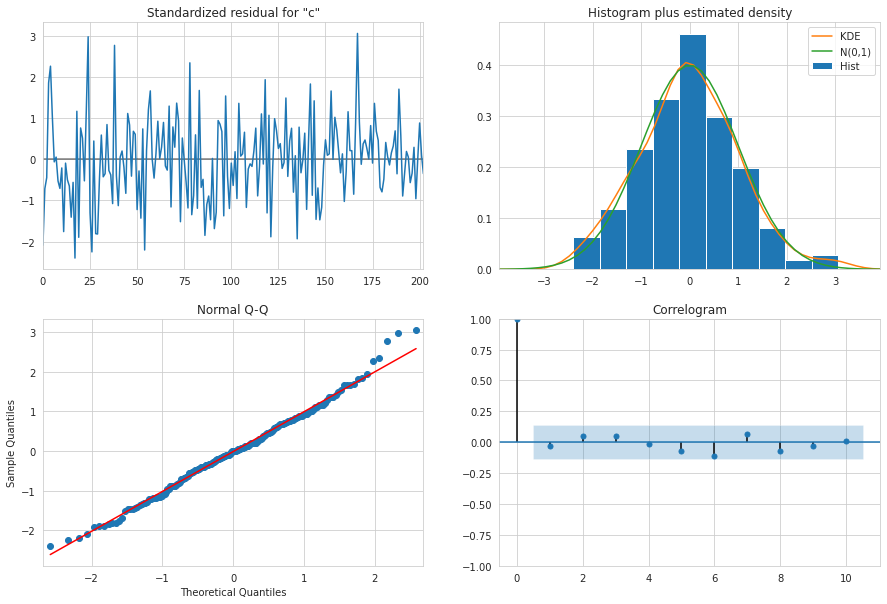

In [0]:
model_fit.plot_diagnostics(figsize=(15, 10))
plt.show()

In [0]:
forecast = model_fit.forecast(n_period,
                              exog=test['TAVG'].to_numpy().reshape(-1, 1)
                             ).to_numpy()
actual = test['count'].to_numpy()

MAPE = np.mean(np.abs(forecast - actual) / np.abs(actual))
corr_coef = np.corrcoef(forecast, actual)[0, 1]

print(f'The MAPE value of the {n_period}-month forecast is {MAPE:.4f} (the lower the better).') # Not using temperature - 0.0316; Using temperature - 0.0285
print(f'The correlation coefficient between the actual values and the forecasts is {corr_coef:.4f} ([-1, 1], the higher the better).') # Not using temperature - 0.9493; Using temperature - 0.9621

The MAPE value of the 12-month forecast is 0.0285 (the lower the better).
The correlation coefficient between the actual values and the forecasts is 0.9621 ([-1, 1], the higher the better).

In [0]:
res_df = pd.DataFrame({'Date': monthly_pd['Date'],
                       'Observed': monthly_pd['count'],
                       'Predicted': pd.concat([model_fit.predict(), model_fit.forecast(n_period,
                                                                                       exog=test['TAVG'].to_numpy().reshape(-1, 1)
                                                                                      )])
                      }).iloc[12:].reset_index(drop=True)
res_df_sns = pd.melt(res_df, id_vars=['Date'], value_vars=['Observed', 'Predicted'], var_name='Type', value_name='Count')

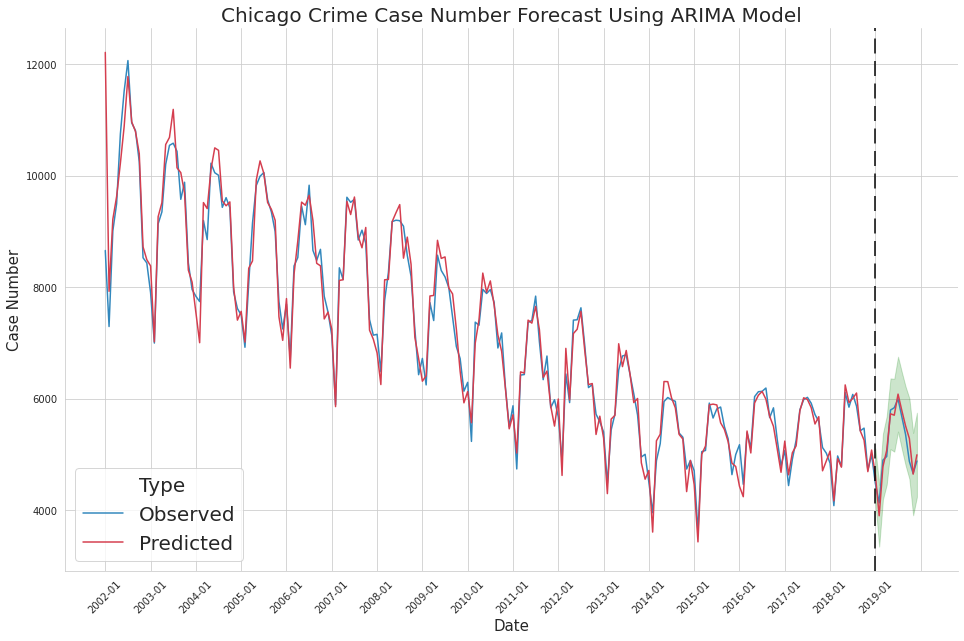

In [0]:
forecast_res = model_fit.get_forecast(n_period,
                                      exog=test['TAVG'].to_numpy().reshape(-1, 1)
                                     )
ci = forecast_res.conf_int(alpha=0.05)

fig, ax = plt.subplots(figsize=(16, 10))
ax.set_xticks(np.arange(0, res_df.shape[0]+1, step=12))
plt.xticks(rotation=45)
sns.lineplot(x='Date', y='Count', hue='Type', palette=['#3288bd', '#d53e4f'], ax=ax, data=res_df_sns)
ax.fill_between(test['Date'], ci.iloc[:, 0], ci.iloc[:, 1], color='green', alpha=0.2)
ax.axvline(res_df.index[-n_period], 0, 1, color='black', dashes=[10, 5])
ax.set_title('Chicago Crime Case Number Forecast Using ARIMA Model', fontsize=20)
ax.set_xlabel('Date', fontsize=15)
ax.set_ylabel('Case Number', fontsize=15)
ax.legend(prop={'size': 20})
sns.despine()

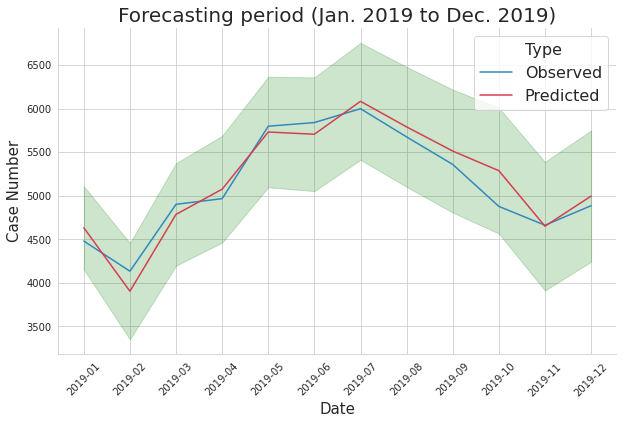

In [0]:
forecast_2019 = res_df_sns[res_df_sns.Date.str.startswith('2019')]

fig, ax = plt.subplots(figsize=(10, 6))
ax.set_xticks(np.arange(0, n_period+1))
plt.xticks(rotation=45)
sns.lineplot(x='Date', y='Count', hue='Type', palette=['#3288bd', '#d53e4f'], ax=ax, data=forecast_2019)
ax.fill_between(test['Date'], ci.iloc[:, 0], ci.iloc[:, 1], color='green', alpha=0.2)
ax.legend(prop={'size': 16})
ax.set_title('Forecasting period (Jan. 2019 to Dec. 2019)', fontsize=20)
ax.set_xlabel('Date', fontsize=15)
ax.set_ylabel('Case Number', fontsize=15)
sns.despine()

### Summary

Though Chicago is home to top tier educational institutions and a vibrant city that delivers great arts and cultural experiences, *its long history of crime has been a significant concern for people living in the city and prevents them from fully enjoying their urban life here*. In order to **extract patterns from crime incidents in the past and help the Chicago police department design patrol systems**, I performed **data cleaning, visualization, clustering, and time series analysis** on 1 million+ violent crime records from 2001-2020 using **the Dataframe API from Apache Spark**. My analyses yield the following key findings:

- The violent crime in Chicago exhibits obvious seasonal patterns, with the number of cases seeing rapid increase in Spring and Summer and becoming relatively lower in Winter. This strongly suggests that the case number is correlated with weather. During Winter, the case number sees a local maximum in December/January - the holiday season, suggesting it is also associated with social factors. **As a general advice, more police should be deployed in Spring/Summer (warmer temperatures) and during holidays across the city**;

- The geographical map shows that certain districts in the South and West of Chicago see higher number of violent crimes compared with others. Moreover, the heatmap points out that certain neighborhoods have highly localized incidents, which are also in the South and West but not necessarily only in the districts with high numbers. **Localized police deployment at these hotspots is strongly recommended**;

- Helicopter patrol at night (that's also when many crimes happen) provide a good means to survey the area since they are equipped with thermal imaging cameras. It is essential to choose ideal places to build the helicopter centers, which should be at the center of a region that has localized crime incidents and behaves like a cluster. Using K-means clustering, I put the crime cases across the city into 6 clusters. The silhouette score (0.5874) evaluation metric shows that the clustering analysis yields reasonably compact and localized results. **Therefore, the center of these 6 clusters are ideal locations to build the center for police helicopters**;

- To prevent future crimes, it is critical to predict how many cases are likely to take place in the future. Here, I used the ARIMA model to perform time series forecasting. I trained the model on monthly aggregated data from 2001-2018 and evaluted the model using the 12-month data from 2019. The ACF and PACF plots helped me stationalize the original data and I used a package `pmdarima` to automatically choose the idea hyperparameters for the model. Finally, I used the model to forecast the number of cases in each of the 12 months in 2019 and the MAPE and correlation coefficient metrics indicate reasonably well performance of my model.

### Useful resources that helped me complete this project

#### Time series analysis
- https://towardsdatascience.com/how-not-to-use-machine-learning-for-time-series-forecasting-avoiding-the-pitfalls-19f9d7adf424 (predict the diff, NOT the data itself!!)
- https://towardsdatascience.com/significance-of-acf-and-pacf-plots-in-time-series-analysis-2fa11a5d10a8
- https://people.duke.edu/~rnau/411sdif.htm (Very very helpful)
- https://otexts.com/fpp3/ (Nice book! Check Ch13 for why forecasting daily data is difficult.)
- https://www.machinelearningplus.com/time-series/arima-model-time-series-forecasting-python/ (mentions auto arima package `pmdarima`)